In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import re
import nltk
from nltk.corpus import stopwords
import string
import json
from time import time
import pickle
from torchvision import models, transforms
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pad_sequence
import heapq
import cv2
import torch.nn.functional as F
import random

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
def readTextFile(path):
    with open(path) as f:
        captions = f.read()
    return captions

captions = readTextFile("./Datasets/flicker8kTextfiles/Flickr8k.token.txt")
captions = captions.split('\n')[:-1]

In [4]:
descriptions = {}

for x in captions:
    first, second = x.split('\t')
    img_name = first.split(".")[0]
    
    if descriptions.get(img_name) is None:
        descriptions[img_name] = []
    
    descriptions[img_name].append(second)

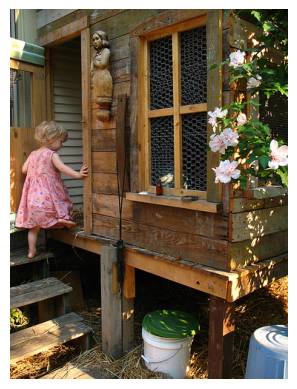

In [5]:
IMG_PATH = "Datasets/images/Flicker8k_Dataset/"

img = cv2.imread(IMG_PATH + "1000268201_693b08cb0e.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis("off")
plt.show()

In [6]:
def clean_text(sentence):
    sentence = sentence.lower()
    sentence = re.sub("[^a-z]+", " ", sentence)
    sentence = sentence.split()
    
    sentence = [s for s in sentence if len(s) > 1]
    sentence = " ".join(sentence)
    return sentence

In [7]:
for key, caption_list in descriptions.items():
    for i in range(len(caption_list)):
        caption_list[i] = clean_text(caption_list[i])

In [8]:
with open("descriptions_1.txt", "w") as f:
    f.write(str(descriptions))

In [9]:
descriptions = None
with open("descriptions_1.txt", 'r') as f:
    descriptions = f.read()
    
json_acceptable_string = descriptions.replace("'", "\"")
descriptions = json.loads(json_acceptable_string)

In [10]:
vocab = set()
for key in descriptions.keys():
    [vocab.update(sentence.split()) for sentence in descriptions[key]]
    
print("Vocab Size : %d" % len(vocab))

Vocab Size : 8424


In [11]:
total_words = []

for key in descriptions.keys():
    [total_words.append(i) for des in descriptions[key] for i in des.split()]
    
print("Total Words %d" % len(total_words))

Total Words 373837


In [12]:
import collections

counter = collections.Counter(total_words)
freq_cnt = dict(counter)
print(len(freq_cnt.keys()))

sorted_freq_cnt = sorted(freq_cnt.items(), reverse=True, key=lambda x: x[1])

threshold = 10
sorted_freq_cnt = [x for x in sorted_freq_cnt if x[1] > threshold]
total_words = [x[0] for x in sorted_freq_cnt]

8424


In [13]:
train_file_data = readTextFile("Datasets/flicker8kTextfiles/Flickr_8k.trainImages.txt")
test_file_data = readTextFile("Datasets/flicker8kTextfiles/Flickr_8k.testImages.txt")
train = [row.split(".")[0] for row in train_file_data.split("\n")[:-1]]
test = [row.split(".")[0] for row in test_file_data.split("\n")[:-1]]

In [14]:
train_descriptions = {}

for img_id in train:
    train_descriptions[img_id] = []
    for cap in descriptions[img_id]:
        cap_to_append = "startseq " + cap + " endseq"
        train_descriptions[img_id].append(cap_to_append)

In [15]:
resnet = models.resnet50(pretrained=True)
resnet = nn.Sequential(*list(resnet.children())[:-1])
resnet.to(device)
resnet.eval()

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def preprocess_img(img_path):
    img = Image.open(img_path).convert('RGB')
    img = preprocess(img)
    img = img.unsqueeze(0)
    return img

def encode_image(img):
    with torch.no_grad():
        feature_vector = resnet(img.to(device))
    feature_vector = feature_vector.view(feature_vector.size(0), -1)
    return feature_vector

D:\anaconda\ana3\envs\gpu_env\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\anaconda\ana3\envs\gpu_env\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [16]:
start = time()
encoding_train = {}

for ix, img_id in enumerate(train):
    img_path = IMG_PATH + "/" + img_id + ".jpg"
    img = preprocess_img(img_path)
    encoding_train[img_id] = encode_image(img).squeeze().cpu().numpy()
    
    if ix % 100 == 0:
        print("Encoding in Progress Time step %d " % ix)
        
end_t = time()
print("Total Time Taken :", end_t - start)

with open("saved/encoded_train_features.pkl", "wb") as f:
    pickle.dump(encoding_train, f)

Encoding in Progress Time step 0 
Encoding in Progress Time step 100 
Encoding in Progress Time step 200 
Encoding in Progress Time step 300 
Encoding in Progress Time step 400 
Encoding in Progress Time step 500 
Encoding in Progress Time step 600 
Encoding in Progress Time step 700 
Encoding in Progress Time step 800 
Encoding in Progress Time step 900 
Encoding in Progress Time step 1000 
Encoding in Progress Time step 1100 
Encoding in Progress Time step 1200 
Encoding in Progress Time step 1300 
Encoding in Progress Time step 1400 
Encoding in Progress Time step 1500 
Encoding in Progress Time step 1600 
Encoding in Progress Time step 1700 
Encoding in Progress Time step 1800 
Encoding in Progress Time step 1900 
Encoding in Progress Time step 2000 
Encoding in Progress Time step 2100 
Encoding in Progress Time step 2200 
Encoding in Progress Time step 2300 
Encoding in Progress Time step 2400 
Encoding in Progress Time step 2500 
Encoding in Progress Time step 2600 
Encoding in P

In [17]:
word_to_idx = {}
idx_to_word = {}

for i, word in enumerate(total_words):
    word_to_idx[word] = i + 1
    idx_to_word[i + 1] = word

idx_to_word[1846] = 'startseq'
word_to_idx['startseq'] = 1846

idx_to_word[1847] = 'endseq'
word_to_idx['endseq'] = 1847

vocab_size = len(word_to_idx) + 1
print("Vocab Size", vocab_size)

Vocab Size 1848


In [18]:
max_len = 0 
for key in train_descriptions.keys():
    for cap in train_descriptions[key]:
        max_len = max(max_len, len(cap.split()))
        
print(max_len)

35


In [20]:
with open("./storage/word_to_idx.pkl","wb") as w2i:
    pickle.dump(word_to_idx, w2i)
with open("./storage/idx_to_word.pkl","wb") as i2w:
    pickle.dump(idx_to_word, i2w)

In [21]:
class CaptionDataset(Dataset):
    def __init__(self, descriptions, encoding, word_to_idx, max_len):
        self.descriptions = descriptions
        self.encoding = encoding
        self.word_to_idx = word_to_idx
        self.max_len = max_len
        self.img_ids = list(self.descriptions.keys())
    
    def __len__(self):
        return len(self.img_ids)
    
    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        photo = self.encoding[img_id]
        captions = self.descriptions[img_id]
        
        caption = random.choice(captions)  # Randomly select one caption for each image
        seq = [self.word_to_idx[word] for word in caption.split() if word in self.word_to_idx]
        
        return torch.tensor(photo), torch.tensor(seq)

In [22]:
train_dataset = CaptionDataset(train_descriptions, encoding_train, word_to_idx, max_len)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

In [23]:
f = open("./saved/glove.6B.50d.txt", encoding='utf8')
embedding_index = {}

for line in f:
    values = line.split()
    
    word = values[0]
    word_embedding = np.array(values[1:], dtype='float')
    embedding_index[word] = word_embedding
f.close()

In [24]:
def get_embedding_matrix():
    emb_dim = 50
    matrix = np.zeros((vocab_size, emb_dim))
    for word, idx in word_to_idx.items():
        embedding_vector = embedding_index.get(word)
        
        if embedding_vector is not None:
            matrix[idx] = embedding_vector
            
    return matrix

embedding_matrix = get_embedding_matrix()
embedding_matrix.shape

(1848, 50)

In [25]:
class CaptionModel(nn.Module):
    def __init__(self, vocab_size, embed_size, hidden_size):
        super(CaptionModel, self).__init__()
        self.embed = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size + 2048, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, vocab_size)
    
    def forward(self, features, captions):
        embeddings = self.embed(captions)
        features = features.unsqueeze(1).repeat(1, embeddings.size(1), 1)
        lstm_input = torch.cat((features, embeddings), dim=2)
        lstm_out, _ = self.lstm(lstm_input)
        outputs = self.fc(lstm_out)
        return outputs

In [26]:
model = CaptionModel(vocab_size, 50, 256)
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [27]:
def collate_fn(batch):
    photos, captions = zip(*batch)
    
    photos = torch.stack(photos)
    
    # Pad captions
    lengths = [len(cap) for cap in captions]
    targets = torch.zeros(len(captions), max(lengths)).long()
    for i, cap in enumerate(captions):
        end = lengths[i]
        targets[i, :end] = cap[:end]
    
    return photos, targets, lengths


from torch.utils.data import DataLoader
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, collate_fn=collate_fn)

def train():
    for epoch in range(100):
        model.train()
        total_loss = 0
        for i, (photos, captions, lengths) in enumerate(train_loader):
            photos = photos.to(device)
            captions = captions.to(device)
            
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(photos, captions[:, :-1])  # Remove last token (endseq)
            
            # Prepare targets (shift by one position)
            targets = captions[:, 1:]  # Remove first token (startseq)
            
            # Flatten outputs and targets
            outputs = outputs.reshape(-1, vocab_size)
            targets = targets.reshape(-1)
            
            # Compute loss
            loss = criterion(outputs, targets)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
# Call the training function
train()

In [28]:
print("Generating test encodings...")
encoding_test = {}
with torch.no_grad():
    for img_name in test:
        img_path = f"{IMG_PATH}/{img_name}.jpg"
        img = preprocess_img(img_path)
        img = img.to(device)
        features = resnet(img)
        encoding_test[img_name] = features.squeeze().cpu().numpy()

print(f"Test encodings generated for {len(encoding_test)} images.")

# Optionally, save the encodings for future use
with open("saved/encoded_test_features.pkl", "wb") as f:
    pickle.dump(encoding_test, f)
print("Test encodings saved to disk.")

Generating test encodings...
Test encodings generated for 1000 images.
Test encodings saved to disk.


In [29]:
def predict_caption(photo, beam_size=20):
    model.eval()
    with torch.no_grad():
        photo = torch.tensor(photo).unsqueeze(0).to(device)
        start = torch.tensor([word_to_idx['startseq']]).unsqueeze(0).to(device)
        
        sequences = [(start, 0.0)]
        
        for _ in range(max_len):
            all_candidates = []
            for seq, score in sequences:
                if seq[0, -1].item() == word_to_idx['endseq']:
                    all_candidates.append((seq, score))
                    continue
                
                output = model(photo, seq)
                output = output[:, -1, :]
                probabilities = F.softmax(output, dim=-1)
                
                top_probs, top_indices = probabilities.topk(beam_size)
                
                for i in range(beam_size):
                    next_seq = torch.cat([seq, top_indices[:, i].unsqueeze(1)], dim=1)
                    next_score = score - torch.log(top_probs[0, i]).item()
                    all_candidates.append((next_seq, next_score))
            
            sequences = sorted(all_candidates, key=lambda x: x[1])[:beam_size]
            
            if all(seq[0, -1].item() == word_to_idx['endseq'] for seq, _ in sequences):
                break
    
    best_sequence = min(sequences, key=lambda x: x[1])[0].squeeze()
    caption = ' '.join([idx_to_word[idx.item()] for idx in best_sequence if idx.item() not in [word_to_idx['startseq'], word_to_idx['endseq']]])
    return caption

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

In [31]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


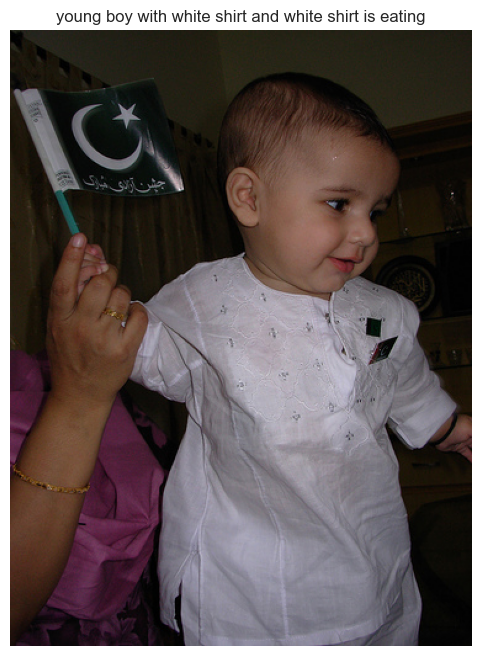

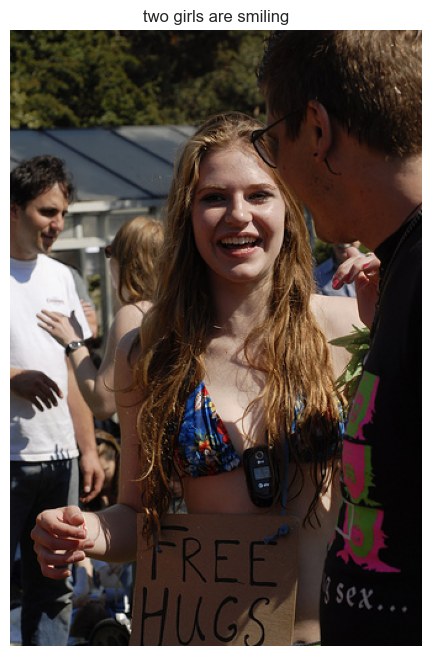

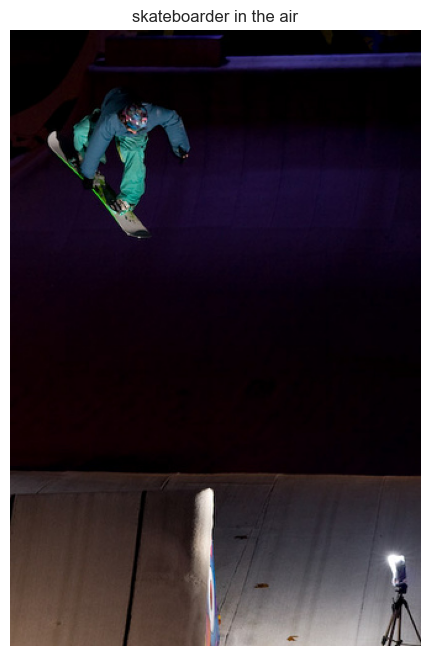

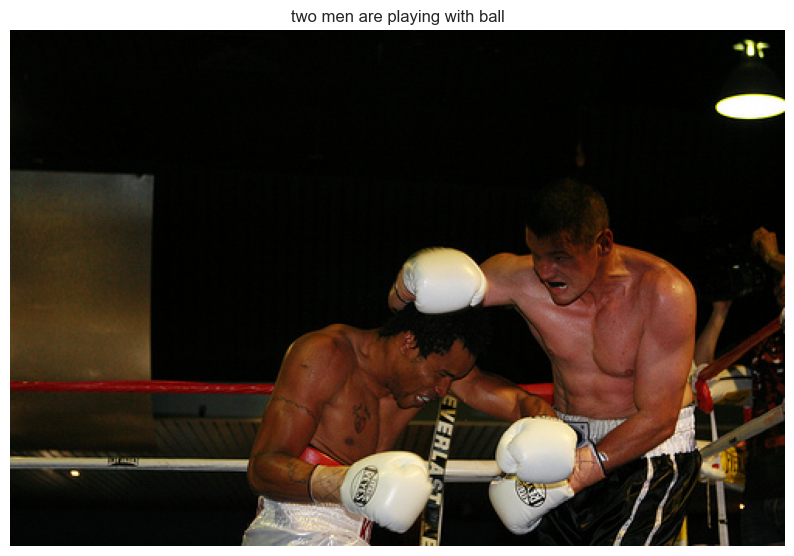

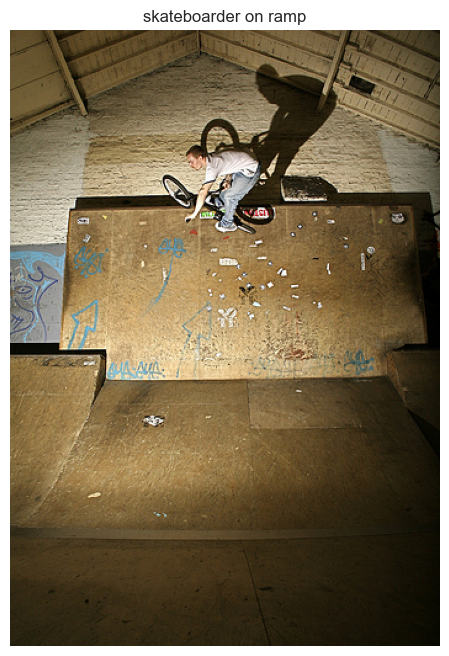

...

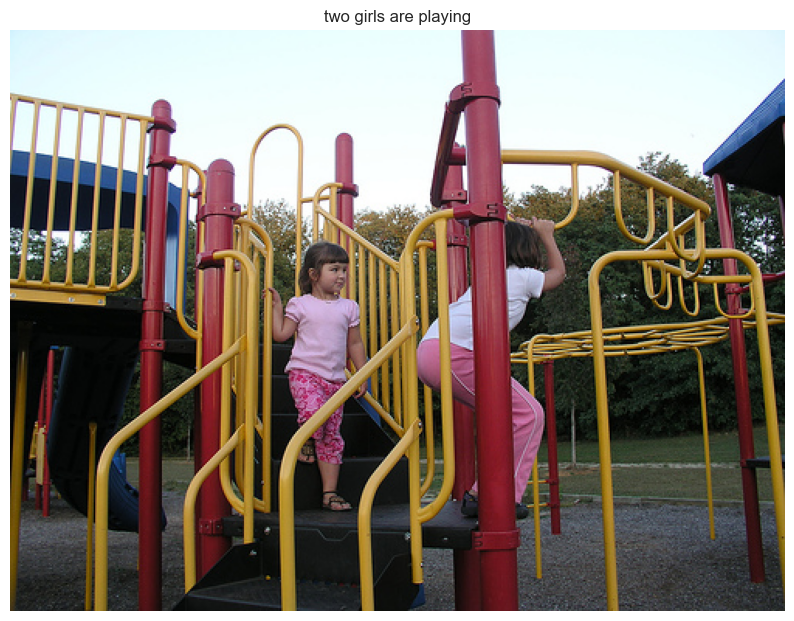

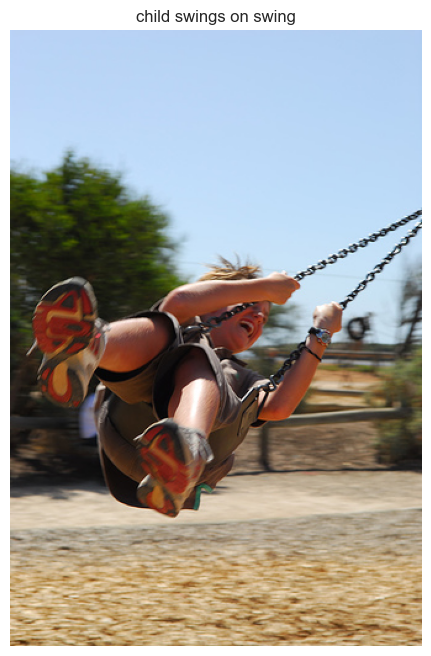

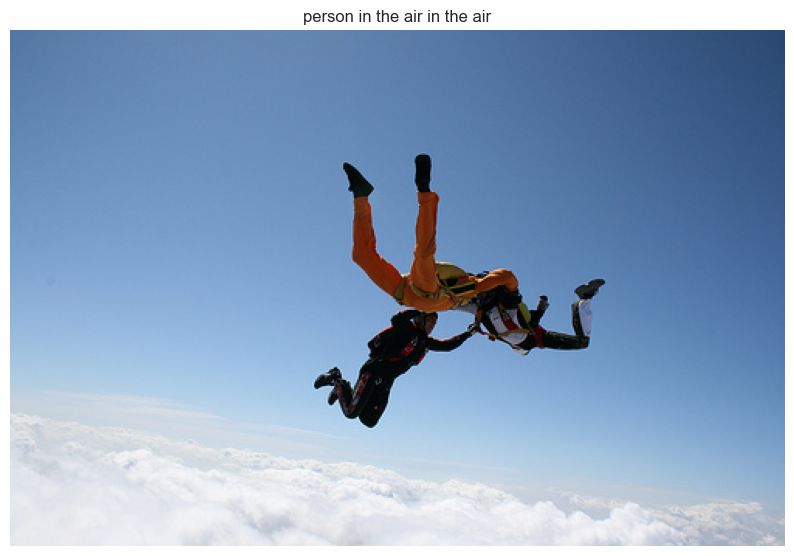

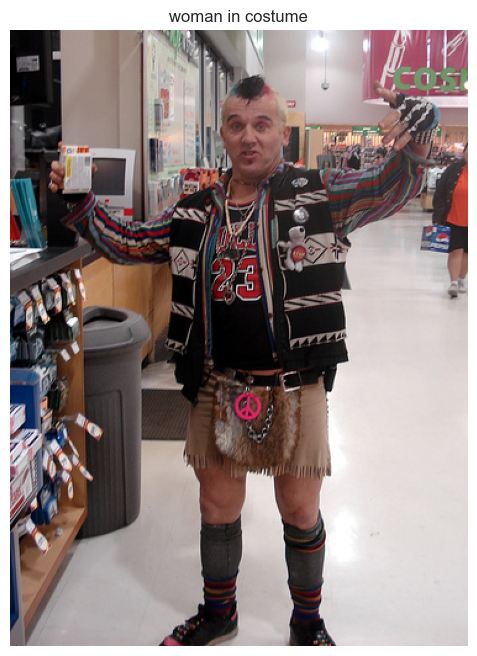

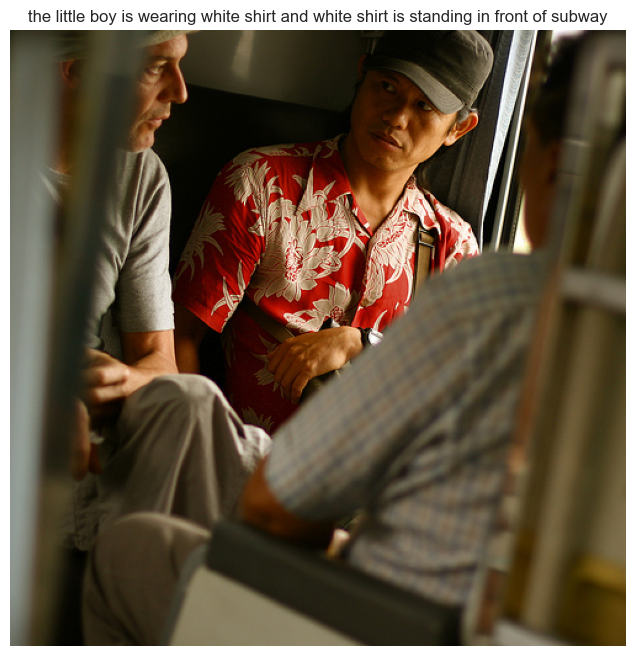

In [33]:
# Pick Some Random Images and See Results
plt.style.use("seaborn-v0_8-whitegrid")
for i in range(15):
    idx = np.random.randint(0, len(test))
    img_name = test[idx]
    photo_2048 = encoding_test[img_name]
    
    img = Image.open(f"Datasets/images/Flicker8k_Dataset/{img_name}.jpg")
    
    caption = predict_caption(photo_2048)
    
    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.title(caption)
    plt.axis("off")
    plt.show()